# Asset Allocation in Python

## Evaluating the performance of a basic 1/n portfolio

In [1]:
# importing the neccessary libraries

import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import pyfolio as pf
import scipy.optimize as sco
import empyrical as ep
import pypf

# Set up plotting style and configurations
plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') # alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300

# Suppress FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Configure Jupyter notebook for inline plotting and retina display
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

C:\Users\USER\anaconda3\Lib\site-packages\pyfolio\pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(
C:\Users\USER\AppData\Local\Temp\ipykernel_24196\1988536415.py:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


2. Set up the parameters:

In [2]:
# Define constants
RISKY_ASSETS = ['AAPL', 'IBM', 'MSFT', 'X']
START_DATE = '2017-01-01'
END_DATE = '2018-12-31'

# Download the stock prices from Yahoo Finance
prices_df = yf.download(RISKY_ASSETS, start=START_DATE, end=END_DATE)
print(f'Downloaded {prices_df.shape[0]} rows of data.')

[*********************100%%**********************]  4 of 4 completed

Downloaded 501 rows of data.


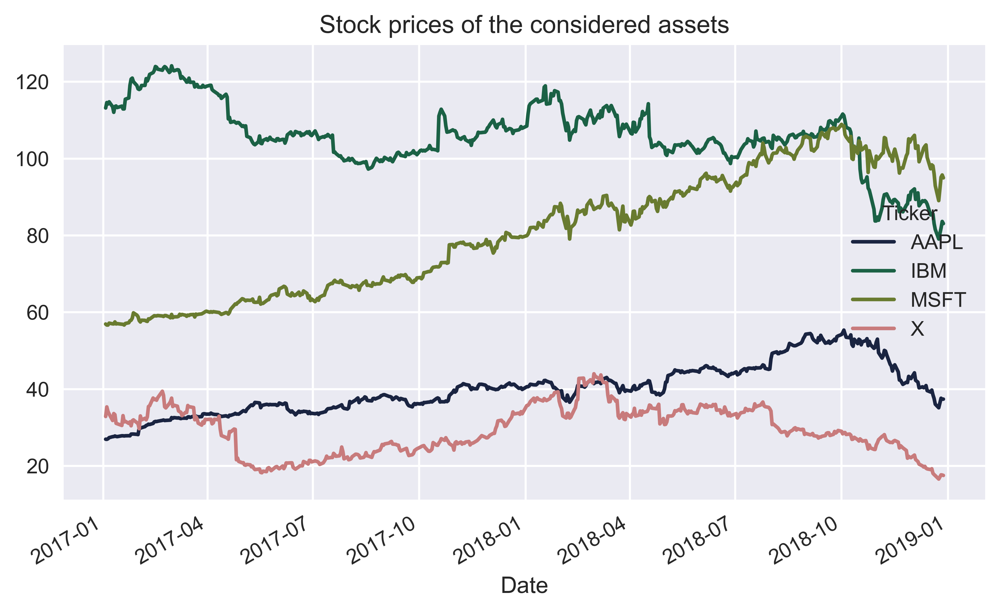

In [3]:
# Check if 'Adj Close' is available
if 'Adj Close' in prices_df:
    adj_close_df = prices_df['Adj Close']
    adj_close_df.plot(title='Stock prices of the considered assets')
    plt.show()
else:
    raise ValueError("Adjusted Close prices not found in the downloaded data.")

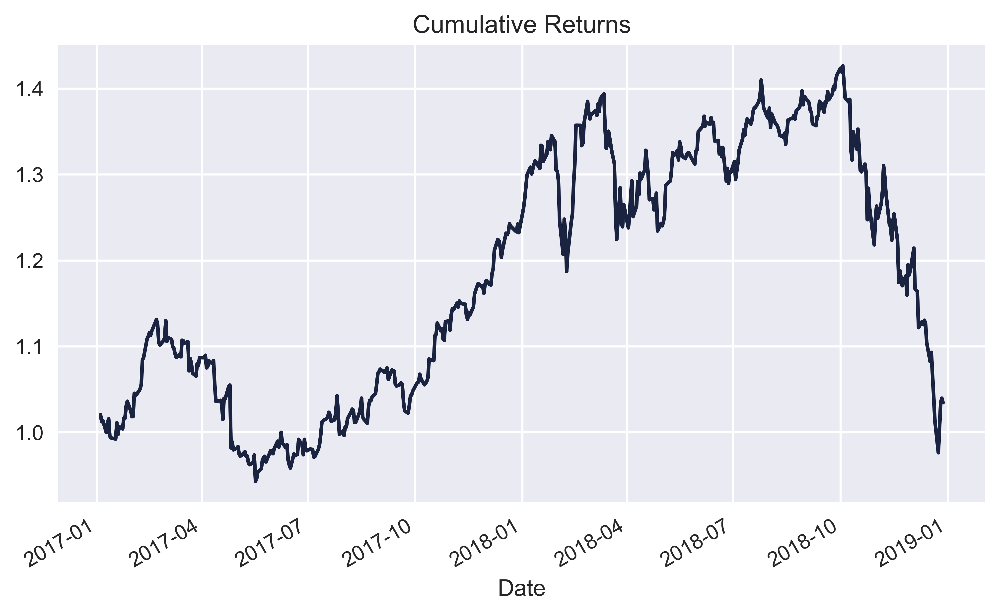

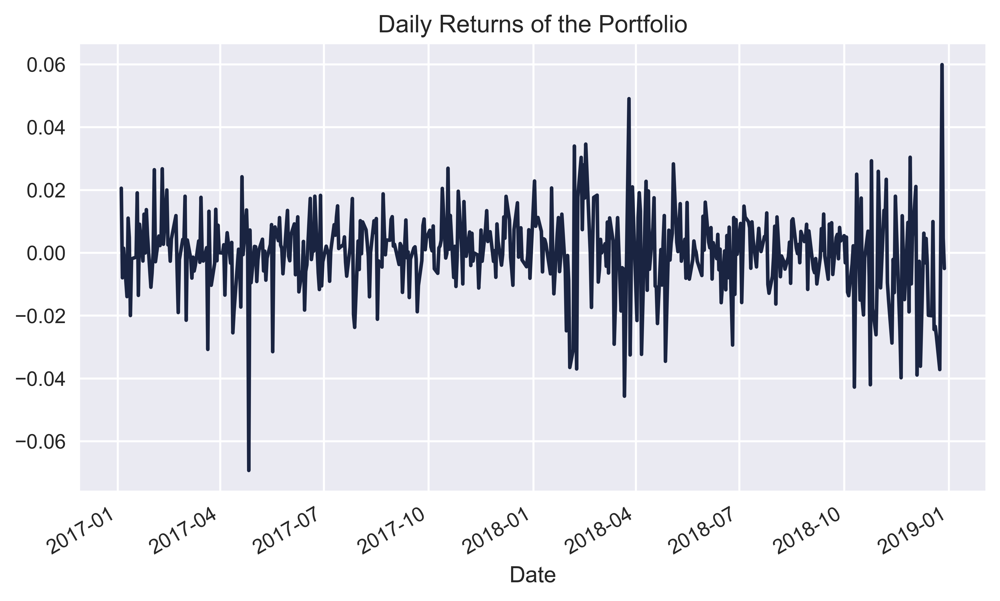

In [4]:
# Calculate individual asset returns
returns = adj_close_df.pct_change().dropna()

# Define the weights
n_assets = len(RISKY_ASSETS)
portfolio_weights = np.array(n_assets * [1 / n_assets])

# Calculate portfolio returns
portfolio_returns = returns.dot(portfolio_weights)

# Plot the cumulative returns
cumulative_returns = ep.cum_returns(portfolio_returns, starting_value=1.0)
cumulative_returns.plot(title='Cumulative Returns')
plt.show()

# Plot the daily returns of the portfolio
portfolio_returns.plot(title='Daily Returns of the Portfolio')
plt.show()

In [5]:
# Calculate performance metrics
annual_return = ep.annual_return(portfolio_returns)
annual_volatility = ep.annual_volatility(portfolio_returns)
sharpe_ratio = ep.sharpe_ratio(portfolio_returns)
max_drawdown = ep.max_drawdown(portfolio_returns)

print(f"Annual Return: {annual_return:.2f}")
print(f"Annual Volatility: {annual_volatility:.2f}")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
print(f"Max Drawdown: {max_drawdown:.2f}")

Annual Return: 0.02
Annual Volatility: 0.21
Sharpe Ratio: 0.19
Max Drawdown: -0.32


## Finding the Efficient Frontier using Monte Carlo simulations

In [6]:
# Define constants
N_PORTFOLIOS = 10**5
N_DAYS = 252
RISKY_ASSETS = ['META', 'TSLA', 'X', 'MSFT']
RISKY_ASSETS.sort()
START_DATE = '2018-01-01'
END_DATE = '2018-12-31'

n_assets = len(RISKY_ASSETS)

# Download the stock prices from Yahoo Finance
prices_df = yf.download(RISKY_ASSETS, start=START_DATE, end=END_DATE)
print(f'Downloaded {prices_df.shape[0]} rows of data.')

[*********************100%%**********************]  4 of 4 completed

Downloaded 250 rows of data.


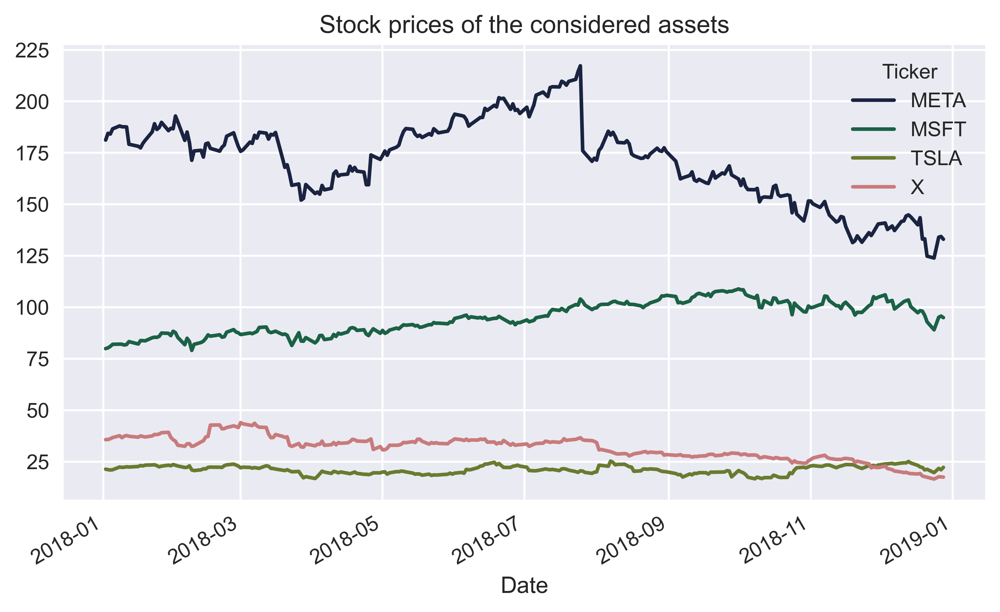

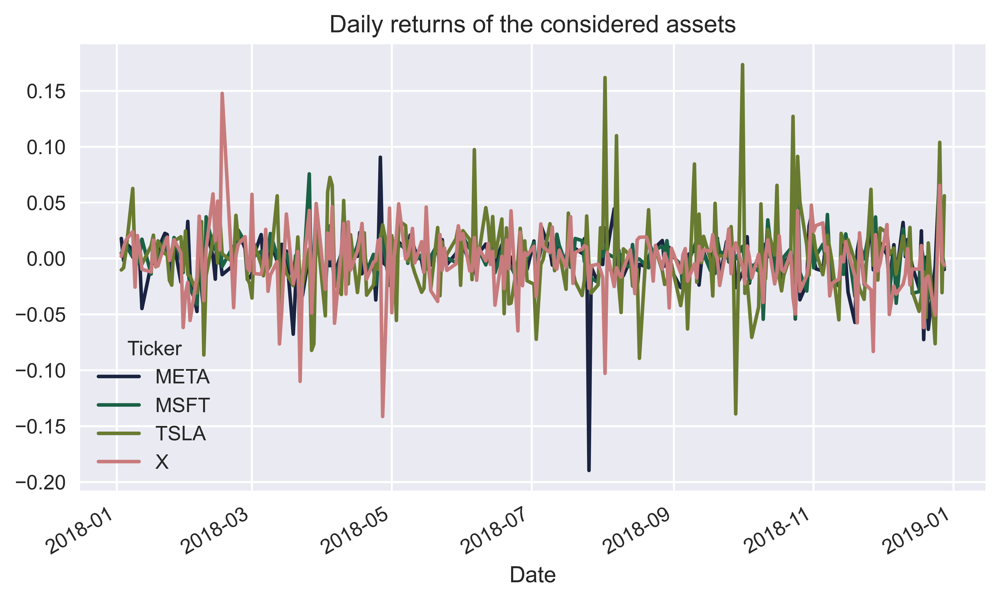

In [7]:
# Check if 'Adj Close' is available
if 'Adj Close' in prices_df:
    adj_close_df = prices_df['Adj Close']
    adj_close_df.plot(title='Stock prices of the considered assets')
    plt.show()
else:
    raise ValueError("Adjusted Close prices not found in the downloaded data.")

# Calculate annualized average returns and the corresponding standard deviation
returns_df = adj_close_df.pct_change().dropna()
avg_returns = returns_df.mean() * N_DAYS
cov_mat = returns_df.cov() * N_DAYS

returns_df.plot(title='Daily returns of the considered assets')
plt.show()

In [8]:
# Simulate random portfolio weights
np.random.seed(42)
weights = np.random.random(size=(N_PORTFOLIOS, n_assets))
weights /= np.sum(weights, axis=1)[:, np.newaxis]

# Calculate portfolio metrics
portf_rtns = np.dot(weights, avg_returns)

# Vectorized calculation of portfolio volatility
portf_vol = np.sqrt(np.einsum('ij,ij->i', np.dot(weights, cov_mat), weights))

# Calculate Sharpe Ratio
portf_sharpe_ratio = portf_rtns / portf_vol

# Create a joint DataFrame with all data
portf_results_df = pd.DataFrame({
    'returns': portf_rtns,
    'volatility': portf_vol,
    'sharpe_ratio': portf_sharpe_ratio
})

# Display the head of the dataframe
print(portf_results_df.head())

    returns  volatility  sharpe_ratio
0 -0.036174    0.299955     -0.120599
1 -0.420110    0.368271     -1.140764
2 -0.251243    0.303963     -0.826558
3 -0.160157    0.309238     -0.517909
4 -0.029917    0.299938     -0.099743


8. Locate the points creating the Efficient Frontier:

In [9]:
N_POINTS = 100
portf_vol_ef = []
portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                            N_POINTS)

# Use set for efficient membership testing
portf_rtns_set = set(portf_rtns)

for point_index in range(N_POINTS):
    rtn = portf_rtns_ef[point_index]
    if rtn not in portf_rtns_set:
        continue
    matched_ind = np.where(portf_rtns == rtn)
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))

# Filter the returns for which we found a matching volatility
portf_rtns_ef = np.array([rtn for rtn in portf_rtns_ef if rtn in portf_rtns_set])

# Convert the results to numpy arrays for further processing if needed
portf_vol_ef = np.array(portf_vol_ef)

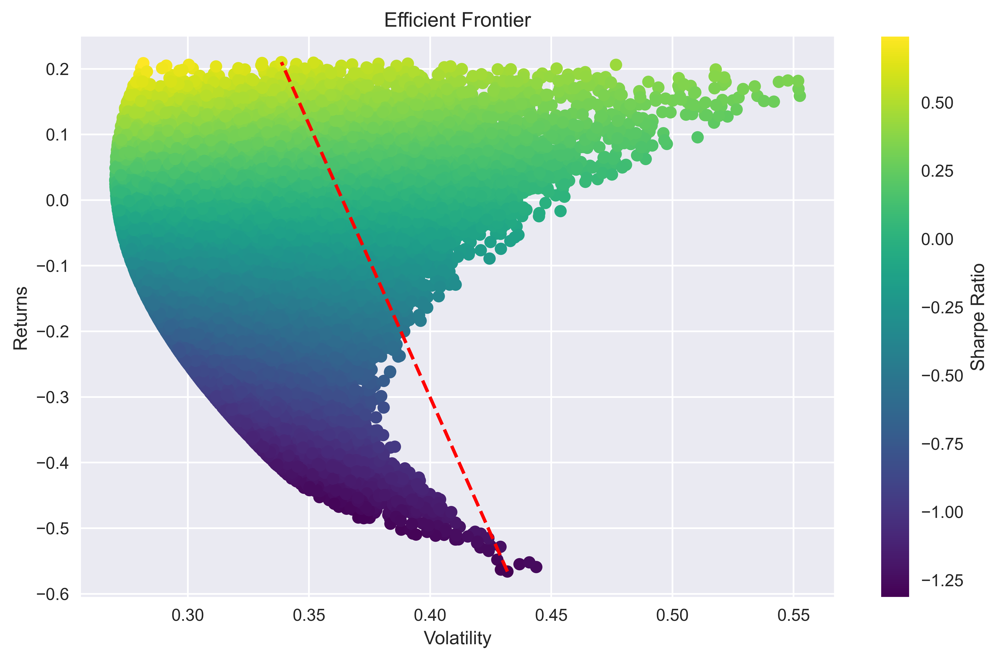

In [10]:
# Plot the efficient frontier
plt.figure(figsize=(10, 6))
plt.scatter(portf_results_df.volatility, portf_results_df.returns, c=portf_results_df.sharpe_ratio, cmap='viridis', marker='o')
plt.plot(portf_vol_ef, portf_rtns_ef, 'r--', linewidth=2)
plt.xlabel('Volatility')
plt.ylabel('Returns')
plt.title('Efficient Frontier')
plt.colorbar(label='Sharpe Ratio')
plt.show()

9. Plot the Efficient Frontier:

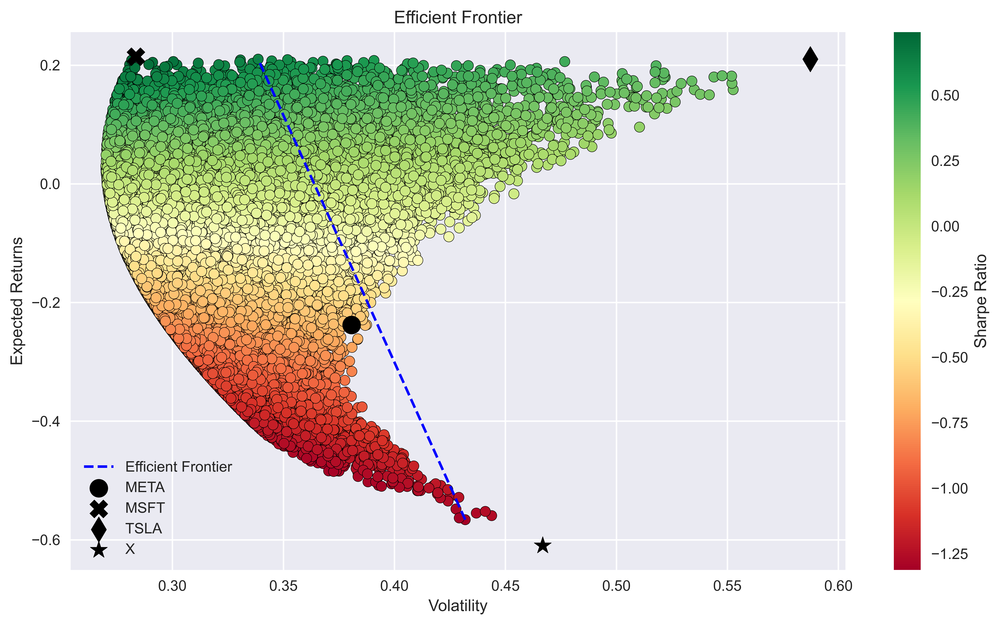

In [11]:
MARKS = ['o', 'X', 'd', '*']

fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(portf_results_df.volatility, 
                     portf_results_df.returns, 
                     c=portf_results_df.sharpe_ratio,
                     cmap='RdYlGn', edgecolors='black')
ax.set_xlabel('Volatility')
ax.set_ylabel('Expected Returns')
ax.set_title('Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--', label='Efficient Frontier')

# Plot individual assets
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
               y=avg_returns[asset_index], 
               marker=MARKS[asset_index], 
               s=150, 
               color='black',
               label=RISKY_ASSETS[asset_index])

# Add legend and colorbar
ax.legend()
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Sharpe Ratio')

plt.tight_layout()
plt.show()

## Finding the Efficient Frontier using optimization with scipy

### This recipe requires running all the code from the recipe *Finding the Efficient Frontier using Monte Carlo simulations*.

In [12]:
# Define functions calculating portfolio returns and volatility:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

# Define the function calculating the efficient frontier:
def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    efficient_portfolios = []
    
    n_assets = len(avg_rtns)
    args = (avg_rtns, cov_mat)
    bounds = tuple((0, 1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = (
            {'type': 'eq', 'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
            {'type': 'eq', 'fun': lambda x: np.sum(x) - 1}
        )
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints, 
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios

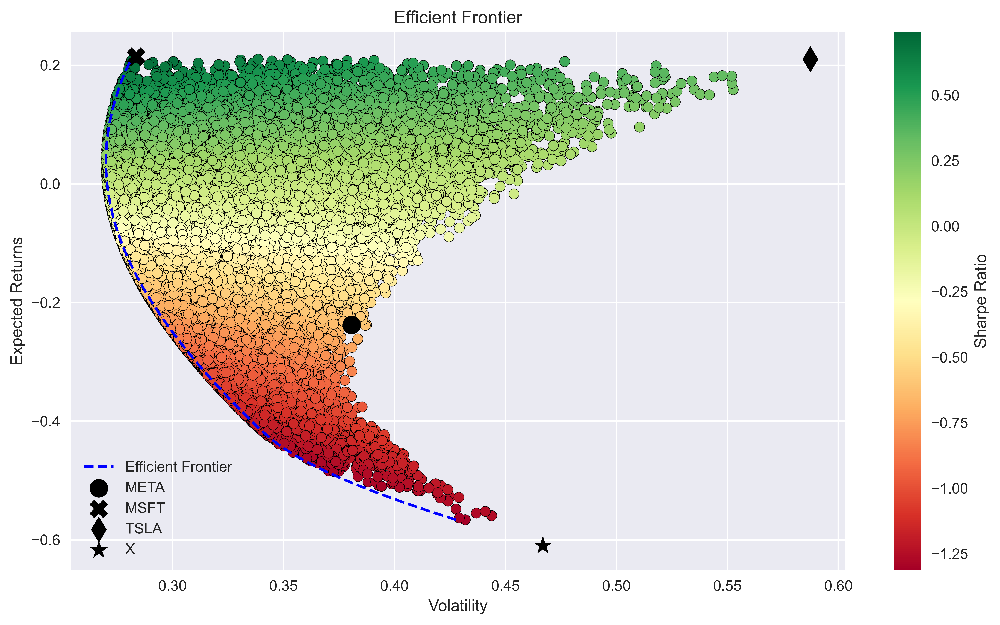

In [13]:
# Define the considered range of returns
rtns_range = np.linspace(portf_results_df.returns.min(), portf_results_df.returns.max(), 100)

# Calculate the Efficient Frontier
efficient_portfolios = get_efficient_frontier(avg_returns, cov_mat, rtns_range)

# Extract volatilities and returns from the efficient frontier
ef_vols = [p['fun'] for p in efficient_portfolios]
ef_rtns = rtns_range

# Plot the efficient frontier
fig, ax = plt.subplots(figsize=(10, 6))
scatter = ax.scatter(portf_results_df.volatility, 
                     portf_results_df.returns, 
                     c=portf_results_df.sharpe_ratio,
                     cmap='RdYlGn', edgecolors='black')

ax.set_xlabel('Volatility')
ax.set_ylabel('Expected Returns')
ax.set_title('Efficient Frontier')
ax.plot(ef_vols, ef_rtns, 'b--', label='Efficient Frontier')

# Plot individual assets
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
               y=avg_returns[asset_index], 
               marker=MARKS[asset_index], 
               s=150, 
               color='black',
               label=RISKY_ASSETS[asset_index])

# Add legend and colorbar
ax.legend()
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Sharpe Ratio')

plt.tight_layout()
plt.show()

8. Identify the minimum volatility portfolio:

In [14]:
# Find the index of the minimum volatility portfolio
min_vol_ind = np.argmin(ef_vols)

# Extract the return and volatility of the minimum volatility portfolio
min_vol_portf_rtn = ef_rtns[min_vol_ind]
min_vol_portf_vol = ef_vols[min_vol_ind]

# Create a dictionary with the minimum volatility portfolio details
min_vol_portf = {
    'Return': min_vol_portf_rtn,
    'Volatility': min_vol_portf_vol,
    'Sharpe Ratio': min_vol_portf_rtn / min_vol_portf_vol
}

# Display the minimum volatility portfolio details
print('Minimum Volatility Portfolio ----')
print('Performance:')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}%')

print('\nWeights:')
for asset, weight in zip(RISKY_ASSETS, efficient_portfolios[min_vol_ind]['x']):
    print(f'{asset}: {100 * weight:.2f}%')

Minimum Volatility Portfolio ----
Performance:
Return: 3.77%
Volatility: 27.00%
Sharpe Ratio: 13.98%

Weights:
META: 16.30%
MSFT: 66.71%
TSLA: 4.50%
X: 12.49%


9. Print performance summary:

In [15]:
# Display the minimum volatility portfolio's performance and weights
print('Minimum Volatility Portfolio ----')
print('Performance:')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}%')

print('\nWeights:')
for asset, weight in zip(RISKY_ASSETS, efficient_portfolios[min_vol_ind]['x']):
    print(f'{asset}: {100 * weight:.2f}%')

Minimum Volatility Portfolio ----
Performance:
Return: 3.77%
Volatility: 27.00%
Sharpe Ratio: 13.98%

Weights:
META: 16.30%
MSFT: 66.71%
TSLA: 4.50%
X: 12.49%
